Table of Contents for this analysis:
1. Import Basic Libraries
2. Loan Credit Database
3. Data Exploration
4. Initial Processing Data
5. Division between predictors and class
6. LabelEncoder
7. OneHotEncoder
8. Escalation of values
9. Divide dataset into training and testing
10. Naïve Bayes
11. Decision Trees
12. XGBoost
13. CATBoost
14. Random Forest
15. Knn
16. SVM
17. Artificial Neural Networks
18. Algorithm Evaluation


In [1]:
# The code is referenced from Dr.Prashanth Nayak: Data Mining andMachine Learning 1, PGDA. Lecture Material. Year 2023
# The code is also referenced from https://www.kaggle.com/datasets/laotse/credit-risk-dataset/code
# x19205040 Min Chen
#1.import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
#2. Loan Credit Database
db = pd. read_csv('credit_risk_dataset.csv')
db

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [3]:
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [4]:
db.isnull().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [5]:
dbLoan = db.dropna()

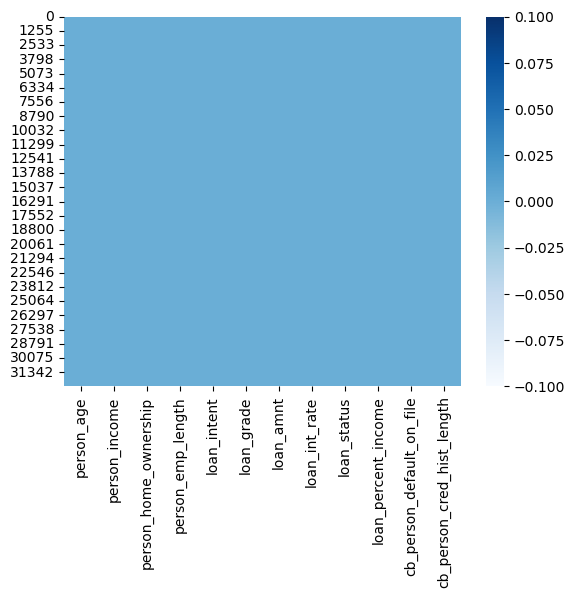

In [6]:
sns.heatmap(dbLoan.isnull(), cmap = 'Blues');

In [7]:
#3. Data exploration
info = dbLoan.describe()
info.style.background_gradient(cmap='Greens')

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000
mean,27.727216,66649.371884,4.788672,9656.493121,11.039867,0.216600,0.169488,5.793736
std,6.310441,62356.447405,4.154627,6329.683361,3.229372,0.411935,0.106393,4.038483
min,20.000000,4000.000000,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,39480.000000,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,55956.000000,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,80000.000000,7.000000,12500.000000,13.480000,0.000000,0.230000,8.000000
max,144.000000,6000000.000000,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


C:\Users\Min_8\AppData\Local\Temp\ipykernel_15704\1096928384.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlations = dbLoan.corr()


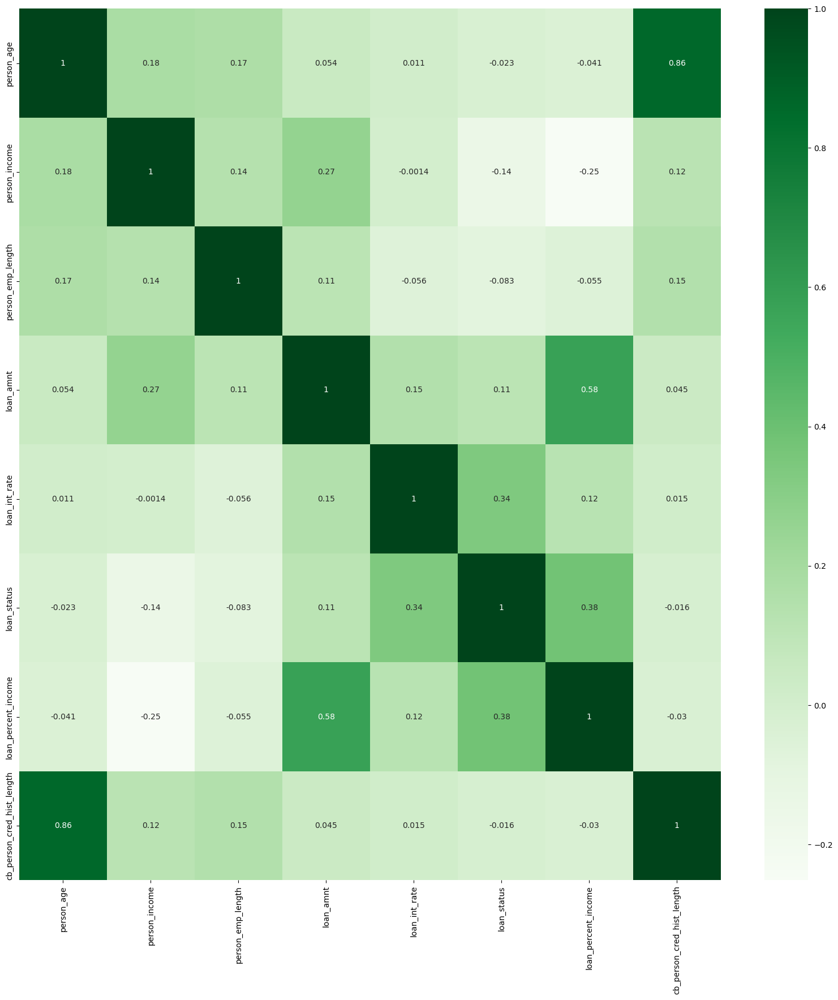

In [8]:
correlations = dbLoan.corr()
f, ax = plt.subplots(figsize = (20,20))
sns.heatmap(correlations, annot=True, cmap = 'Greens')
correlations.round(2);

In [9]:
dbLoan = dbLoan[dbLoan['person_age'] <= 86]
dbLoan['person_age'].max()

84

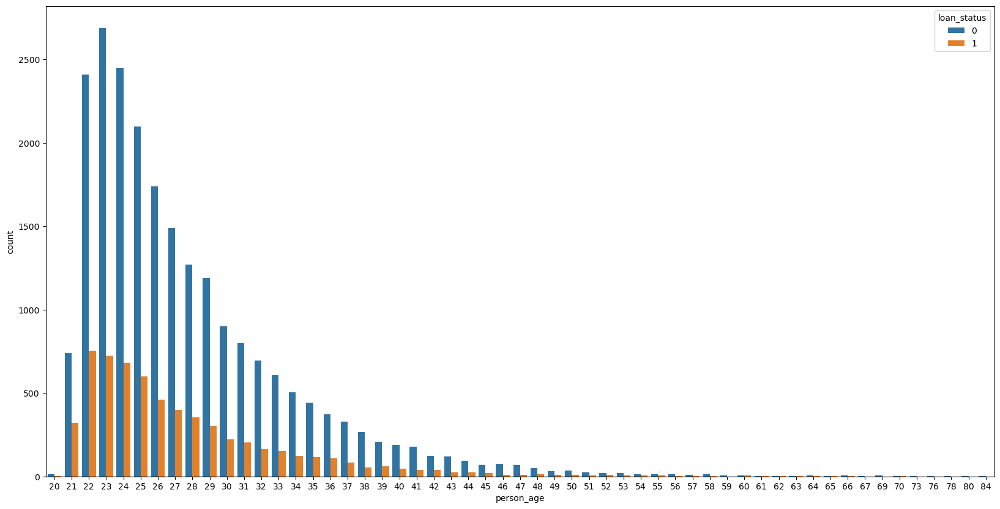

In [10]:
plt.figure(figsize=[20,10])
sns.countplot(x = 'person_age', hue = 'loan_status', data=dbLoan);

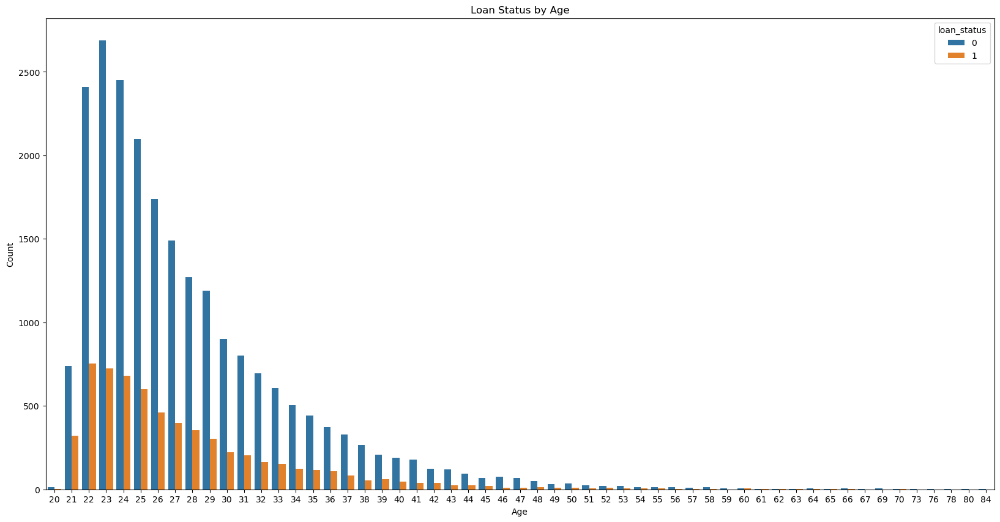

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=[20,10])
sns.countplot(x='person_age', hue='loan_status', data=dbLoan)
plt.title('Loan Status by Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()


People who are younger are not paying the loan, 0 paid and 1 not paid. The greatest default is among the people in 20's.

In [12]:
# Detailed check for people in debt and no debt
debtor = dbLoan[dbLoan['loan_status'] == 1]
non_debtor = dbLoan[dbLoan['loan_status'] == 0]

In [13]:
# Check Debtor's loan_intent to see which aspects caused their highest loan expenses

fig1 = px.histogram(debtor,x='loan_intent',color='loan_intent',template='plotly_dark')
fig1.show()

In [14]:
# Check non_debtor to see where they spend their loan the most
fig2 = px.histogram(non_debtor,x='loan_intent',color='loan_intent',template='plotly_white')
fig2.show()

In [15]:
# Check debtor where they spent the loan on home ownership
fig3 = px.histogram(debtor,x='person_home_ownership',color='person_home_ownership',template=('plotly_dark'))
fig3.show()

In [16]:
# Check non_debtor where they spent loan on home ownership
fig4 = px.histogram(non_debtor,x='person_home_ownership',color='person_home_ownership',template='plotly_white')
fig4.show()

In [17]:
#Check debtor's age
fig5 = px.histogram(debtor,x='person_age',color='person_age',template='plotly_dark')
fig5.show()

In [18]:
#Check person's age, income, loan amount to loan status
scPlot = px.scatter_matrix(dbLoan, dimensions=['person_age', 'person_income', 'loan_amnt'], color = 'loan_status')
scPlot.show()

C:\Users\Min_8\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [19]:
#apply treemap to check 
treeMap = px.treemap(dbLoan, path=['person_age','person_income', 'loan_amnt'])
treeMap.show()

In [20]:
#Check loan intent to loan grade
graph = px.parallel_categories(dbLoan, dimensions=['loan_intent', 'loan_grade'])
graph.show()

C:\Users\Min_8\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [21]:
#Check loan intent, loan grade to loan status
graf = px.parallel_categories(dbLoan, dimensions=['loan_intent', 'loan_grade', 'loan_status'])
graf.show()

C:\Users\Min_8\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [22]:
#4 Initial Data Processing; #5 Division between predictors and target
# select predictors, drop target column loan status
predictors = dbLoan.drop(columns=['loan_status'])
predictors

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0.10,N,26


In [23]:
predictors.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length'],
      dtype='object')

In [24]:
X = predictors.values


In [25]:
type(X)

numpy.ndarray

In [26]:
X

array([[22, 59000, 'RENT', ..., 0.59, 'Y', 3],
       [21, 9600, 'OWN', ..., 0.1, 'N', 2],
       [25, 9600, 'MORTGAGE', ..., 0.57, 'N', 3],
       ...,
       [65, 76000, 'RENT', ..., 0.46, 'N', 28],
       [56, 150000, 'MORTGAGE', ..., 0.1, 'N', 26],
       [66, 42000, 'RENT', ..., 0.15, 'N', 30]], dtype=object)

In [27]:
#use iloc() function to select specific rows and columns
y = dbLoan.iloc[:,8].values

In [28]:
y

array([1, 0, 1, ..., 1, 0, 0], dtype=int64)

In [29]:
#6 LabelEncoder
# Applying LabelEncoder to encode target labels y with value between 0 and n_classes-1.
from sklearn.preprocessing import LabelEncoder
label_encoder_taste = LabelEncoder()

In [30]:
X[0]

array([22, 59000, 'RENT', 123.0, 'PERSONAL', 'D', 35000, 16.02, 0.59, 'Y',
       3], dtype=object)

In [31]:
label_encoder_person_home_ownership = LabelEncoder()
label_encoder_loan_intent = LabelEncoder()
label_encoder_loan_grade = LabelEncoder()
label_encoder_cb_person_default_on_file = LabelEncoder()


In [32]:
X[:,2] = label_encoder_person_home_ownership.fit_transform(X[:,2])
X[:,4] = label_encoder_loan_intent.fit_transform(X[:,4])
X[:,5] = label_encoder_loan_grade.fit_transform(X[:,5])
X[:,9] = label_encoder_cb_person_default_on_file.fit_transform(X[:,9])

In [33]:
X[0]

array([22, 59000, 3, 123.0, 4, 3, 35000, 16.02, 0.59, 1, 3], dtype=object)

In [34]:
X

array([[22, 59000, 3, ..., 0.59, 1, 3],
       [21, 9600, 2, ..., 0.1, 0, 2],
       [25, 9600, 0, ..., 0.57, 0, 3],
       ...,
       [65, 76000, 3, ..., 0.46, 0, 28],
       [56, 150000, 0, ..., 0.1, 0, 26],
       [66, 42000, 3, ..., 0.15, 0, 30]], dtype=object)

In [35]:
#7 Applying OneHotEncoder to encode categorical features as a one-hot numeric array
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [36]:
oheValue = ColumnTransformer(transformers=[('OneHot', OneHotEncoder(), [0,2,4,5,9,10])], remainder='passthrough')

In [37]:
oheValue

ColumnTransformer(remainder='passthrough',
                  transformers=[('OneHot', OneHotEncoder(),
                                 [0, 2, 4, 5, 9, 10])])

In [38]:
X = oheValue.fit_transform(X).toarray()

In [39]:
X

array([[0.000e+00, 0.000e+00, 1.000e+00, ..., 3.500e+04, 1.602e+01,
        5.900e-01],
       [0.000e+00, 1.000e+00, 0.000e+00, ..., 1.000e+03, 1.114e+01,
        1.000e-01],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 5.500e+03, 1.287e+01,
        5.700e-01],
       ...,
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 3.500e+04, 1.099e+01,
        4.600e-01],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 1.500e+04, 1.148e+01,
        1.000e-01],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 6.475e+03, 9.990e+00,
        1.500e-01]])

In [40]:
X.shape

(28634, 108)

In [41]:
#8 Escalate values by scales
from sklearn.preprocessing import StandardScaler
scaled = StandardScaler()
X = scaled.fit_transform(X)
X[0]

array([-2.21171520e-02, -1.96162362e-01,  2.83774523e+00, -3.67863749e-01,
       -3.50322490e-01, -3.22661485e-01, -2.88560441e-01, -2.65612440e-01,
       -2.45205790e-01, -2.34540033e-01, -2.02320406e-01, -1.91016667e-01,
       -1.75966506e-01, -1.64899514e-01, -1.49379571e-01, -1.41106176e-01,
       -1.30848543e-01, -1.20377322e-01, -1.06477923e-01, -9.75659199e-02,
       -9.11616388e-02, -8.75884366e-02, -7.61300063e-02, -7.05964243e-02,
       -6.37777894e-02, -5.64639020e-02, -5.48859748e-02, -5.15873123e-02,
       -4.76989873e-02, -3.78671017e-02, -3.96740718e-02, -3.39677172e-02,
       -3.39677172e-02, -3.01469184e-02, -2.70911818e-02, -2.50802458e-02,
       -2.21171520e-02, -2.28938273e-02, -2.43731920e-02, -1.32154487e-02,
       -2.13122486e-02, -1.67172432e-02, -1.44770516e-02, -1.02362850e-02,
       -1.56372760e-02, -1.32154487e-02, -1.67172432e-02, -5.90971549e-03,
       -1.32154487e-02, -1.32154487e-02, -8.35774575e-03, -5.90971549e-03,
       -5.90971549e-03, -

In [42]:
#Devide processed data X, y into training and testing
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain,ytest = train_test_split(X,y,test_size=0.2, random_state=0)

In [43]:
Xtrain.shape

(22907, 108)

In [44]:
ytrain.shape

(22907,)

In [45]:
Xtest.shape, ytest.shape

((5727, 108), (5727,))

In [46]:
#9 Naive Bayes
from sklearn.naive_bayes import GaussianNB
naiveB = GaussianNB()
naiveB.fit(Xtrain, ytrain)
predict = naiveB.predict(Xtest)
predict

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [47]:
ytest

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [48]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [49]:
accuracy_score(ytest, predict)

0.22053431115767416

In [50]:
confusion_matrix(ytest, predict)

array([[  48, 4451],
       [  13, 1215]], dtype=int64)

In [51]:
#10 Decision Tree
from sklearn.tree import DecisionTreeClassifier

In [52]:
myTree = DecisionTreeClassifier(criterion = 'entropy')
myTree.fit(Xtrain, ytrain)

DecisionTreeClassifier(criterion='entropy')

In [53]:
pred = myTree.predict(Xtest)
pred

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [54]:
accuracy_score(ytest,pred)

0.9029160118735813

In [55]:
pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [56]:
from yellowbrick.classifier import ConfusionMatrix

0.9029160118735813

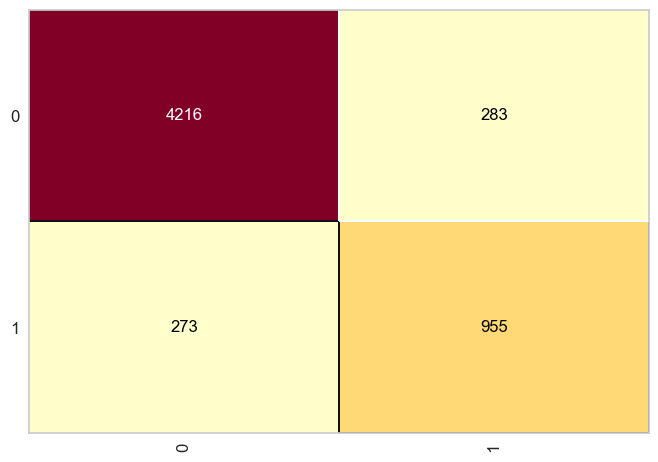

In [57]:
cMatrix = ConfusionMatrix(myTree)
cMatrix.fit(Xtrain, ytrain)
cMatrix.score(Xtest, ytest)

In [58]:
print(classification_report(ytest, pred))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      4499
           1       0.77      0.78      0.77      1228

    accuracy                           0.90      5727
   macro avg       0.86      0.86      0.86      5727
weighted avg       0.90      0.90      0.90      5727



This classification report for a binary classification problemm means that there are two possible classes: 0 and 1. 
The precision, recall, and F1-score are used to evaluate the performance of the classification model.

Precision: The precision for class 0 is 0.94, which means that when the model predicts an instance as belonging to class 0, it is correct 94% of the time. The precision for class 1 is 0.76, which means that when the model predicts an instance as belonging to class 1, it is correct 76% of the time.

Recall: The recall for class 0 is 0.93, which means that the model correctly identifies 93% of the instances that belong to class 0. The recall for class 1 is 0.77, which means that the model correctly identifies 77% of the instances that belong to class 1.

F1-score: The F1-score is a weighted average of precision and recall, with values ranging from 0 to 1. A higher F1-score indicates better overall performance. The F1-score for class 0 is 0.94, while the F1-score for class 1 is 0.77.

Accuracy: The overall accuracy of the model is 0.90, which means that it correctly predicts the class of 90% of the instances in the dataset.

The macro average of precision, recall, and F1-score is calculated by averaging the values for both classes, while the weighted average takes into account the number of instances in each class. The macro average F1-score for this model is 0.85, while the weighted average F1-score is also 0.90.

Overall, this is a good performance, with high precision, recall, and F1-score for class 0, and lower but still reasonable performance for class 1.



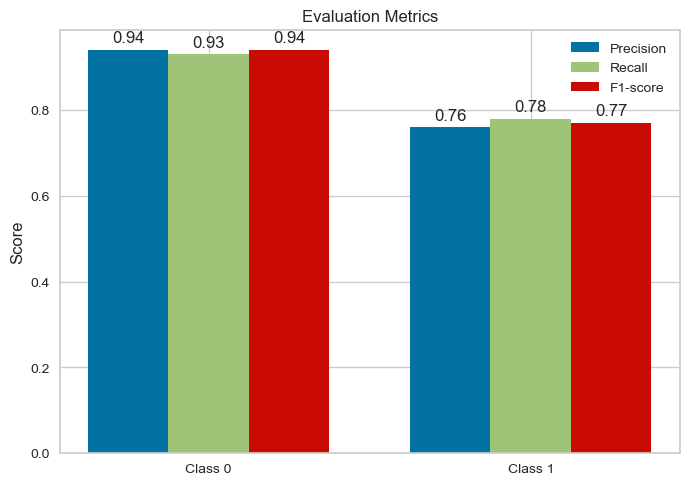

In [59]:
import matplotlib.pyplot as plt
import numpy as np

# Define the precision, recall, and F1-score for each class
precision = [0.94, 0.76]
recall = [0.93, 0.78]
f1_score = [0.94, 0.77]

# Define the labels for the x-axis and y-axis
labels = ['Class 0', 'Class 1']
x = np.arange(len(labels))
width = 0.25

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the precision, recall, and F1-score for both classes
rects1 = ax.bar(x - width, precision, width, label='Precision')
rects2 = ax.bar(x, recall, width, label='Recall')
rects3 = ax.bar(x + width, f1_score, width, label='F1-score')

# Add some text for labels, title, and legend
ax.set_ylabel('Score')
ax.set_title('Evaluation Metrics')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Add the actual values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

# Display the plot
plt.show()


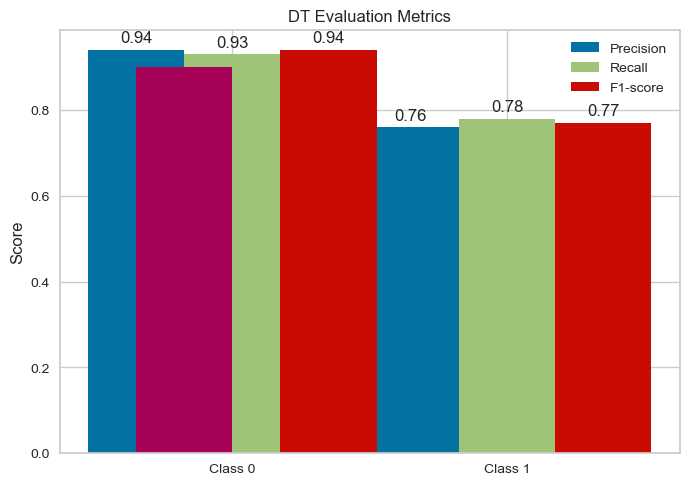

In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Define the precision, recall, and F1-score for each class
precision = [0.94, 0.76]
recall = [0.93, 0.78]
f1_score = [0.94, 0.77]
accuracy = 0.9

# Define the labels for the x-axis and y-axis
labels = ['Class 0', 'Class 1']
x = np.arange(len(labels))
width = 0.35

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the precision, recall, and F1-score for both classes
rects1 = ax.bar(x - width/2, precision, width, label='Precision')
rects2 = ax.bar(x + width/2, recall, width, label='Recall')
rects3 = ax.bar(x + 3*width/2, f1_score, width, label='F1-score')

# Add some text for labels, title, and legend
ax.set_ylabel('Score')
ax.set_title('DT Evaluation Metrics')
ax.set_xticks(x + width/2)
ax.set_xticklabels(labels)
ax.legend()

# Add the actual values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

# Add a separate bar for the overall accuracy metric
ax.bar(['Overall'], [accuracy], width, label='Accuracy')

# Display the plot
plt.show()


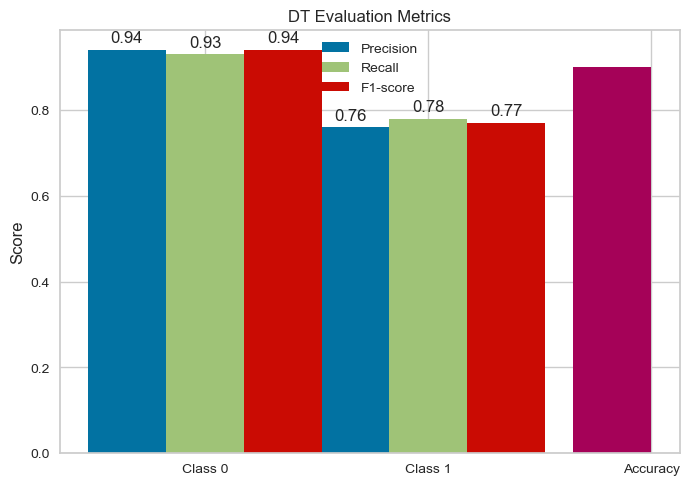

In [61]:
import matplotlib.pyplot as plt
import numpy as np

# Define the precision, recall, and F1-score for each class
precision = [0.94, 0.76]
recall = [0.93, 0.78]
f1_score = [0.94, 0.77]
accuracy = 0.9

# Define the labels for the x-axis and y-axis
labels = ['Class 0', 'Class 1', 'Accuracy']
x = np.arange(len(labels))
width = 0.35

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the precision, recall, and F1-score for both classes
rects1 = ax.bar(x - width/2, precision + [np.nan], width, label='Precision')
rects2 = ax.bar(x + width/2, recall + [np.nan], width, label='Recall')
rects3 = ax.bar(x + 3*width/2, f1_score + [np.nan], width, label='F1-score')

# Add some text for labels, title, and legend
ax.set_ylabel('Score')
ax.set_title('DT Evaluation Metrics')
ax.set_xticks(x + width/2)
ax.set_xticklabels(labels)
ax.legend()

# Add the actual values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        if np.isnan(height):
            continue
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

# Add a separate bar for the overall accuracy metric
ax.bar(x[-1], accuracy, width, label='Accuracy')

# Display the plot
plt.show()


In [62]:
#Evaluate Decision Tree , check RMSE
from sklearn.metrics import mean_squared_error
rmse = mean_squared_error(ytest, pred, squared=False)

In [63]:
print(f"RMSE of the base model: {rmse:.3f}")

RMSE of the base model: 0.312


In [64]:
#11 XGBoost
from xgboost import XGBClassifier

In [65]:
xgb = XGBClassifier(n_estimators = 1000, learning_rate = 0.05, objective = 'binary:logistic', random_state = 10)
xgb.fit(Xtrain, ytrain)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=10, ...)

In [66]:
xgb.score(Xtrain, ytrain)

0.9666040948181779

In [67]:
xgb.score(Xtest, ytest)

0.9366160293347302

In [68]:
predTest = xgb.predict(Xtest)

In [69]:
predTest

array([1, 0, 0, ..., 0, 0, 0])

In [70]:
accuracy_score(ytest, predTest)

0.9366160293347302

In [71]:
print(classification_report(ytest, predTest))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      4499
           1       0.95      0.74      0.83      1228

    accuracy                           0.94      5727
   macro avg       0.94      0.86      0.90      5727
weighted avg       0.94      0.94      0.93      5727



In [72]:
#Evaluate the model , check RMSE
from sklearn.metrics import mean_squared_error
rmse = mean_squared_error(ytest, predTest, squared=False)

In [73]:
print(f"RMSE of the base model: {rmse:.3f}")

RMSE of the base model: 0.252


In [74]:
#12 CatBoost
from catboost import CatBoostClassifier

In [75]:
cat = pd.read_csv('credit_risk_dataset.csv')
cat

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [76]:
boost = cat.iloc[:, 8]
boost

0        1
1        0
2        1
3        1
4        1
        ..
32576    0
32577    0
32578    1
32579    0
32580    0
Name: loan_status, Length: 32581, dtype: int64

In [77]:
predCat = cat.drop(columns=['loan_status'])
predCat

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0.10,N,26


In [78]:
Xtrain, Xtest, ytrain, ytest = train_test_split(predCat, boost, test_size = 0.2, random_state = 0)

In [79]:
category = ['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file']

In [80]:
catboost = CatBoostClassifier(task_type='CPU', iterations=140, learning_rate=0.1, depth = 5, random_state = 5, 
                              eval_metric="Accuracy")

In [81]:
catboost.fit( Xtrain, ytrain, cat_features= category, plot=True, eval_set=(Xtest, ytest))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8306476	test: 0.8338192	best: 0.8338192 (0)	total: 200ms	remaining: 27.8s
1:	learn: 0.8459561	test: 0.8533067	best: 0.8533067 (1)	total: 239ms	remaining: 16.5s
2:	learn: 0.8453039	test: 0.8514654	best: 0.8533067 (1)	total: 282ms	remaining: 12.9s
3:	learn: 0.8482581	test: 0.8591376	best: 0.8591376 (3)	total: 333ms	remaining: 11.3s
4:	learn: 0.8466467	test: 0.8536136	best: 0.8591376 (3)	total: 380ms	remaining: 10.3s
5:	learn: 0.8545887	test: 0.8626669	best: 0.8626669 (5)	total: 425ms	remaining: 9.48s
6:	learn: 0.8564303	test: 0.8626669	best: 0.8626669 (5)	total: 467ms	remaining: 8.87s
7:	learn: 0.8570442	test: 0.8632807	best: 0.8632807 (7)	total: 512ms	remaining: 8.45s
8:	learn: 0.8582336	test: 0.8655823	best: 0.8655823 (8)	total: 556ms	remaining: 8.09s
9:	learn: 0.8688229	test: 0.8724873	best: 0.8724873 (9)	total: 602ms	remaining: 7.83s
10:	learn: 0.8770335	test: 0.8818475	best: 0.8818475 (10)	total: 646ms	remaining: 7.58s
11:	learn: 0.8840930	test: 0.8916679	best: 0.8916679

In [82]:
predCat = catboost.predict(Xtest)
predCat

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [83]:
print("Accuracy: %.2f%%" % (accuracy_score(ytest, predCat) * 100.0))

Accuracy: 93.71%


In [84]:
confusion_matrix(ytest, predCat)

array([[5159,   20],
       [ 390,  948]], dtype=int64)

In [85]:
print(classification_report(ytest, predCat))

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      5179
           1       0.98      0.71      0.82      1338

    accuracy                           0.94      6517
   macro avg       0.95      0.85      0.89      6517
weighted avg       0.94      0.94      0.93      6517



In [86]:
from sklearn.metrics import mean_squared_error
rmse = mean_squared_error(ytest, predCat, squared=False)

In [87]:
print(f"RMSE of the base model: {rmse:.3f}")

RMSE of the base model: 0.251


In [88]:
#13 Random Forest
from sklearn.ensemble import RandomForestClassifier

In [89]:
X[0]

array([-2.21171520e-02, -1.96162362e-01,  2.83774523e+00, -3.67863749e-01,
       -3.50322490e-01, -3.22661485e-01, -2.88560441e-01, -2.65612440e-01,
       -2.45205790e-01, -2.34540033e-01, -2.02320406e-01, -1.91016667e-01,
       -1.75966506e-01, -1.64899514e-01, -1.49379571e-01, -1.41106176e-01,
       -1.30848543e-01, -1.20377322e-01, -1.06477923e-01, -9.75659199e-02,
       -9.11616388e-02, -8.75884366e-02, -7.61300063e-02, -7.05964243e-02,
       -6.37777894e-02, -5.64639020e-02, -5.48859748e-02, -5.15873123e-02,
       -4.76989873e-02, -3.78671017e-02, -3.96740718e-02, -3.39677172e-02,
       -3.39677172e-02, -3.01469184e-02, -2.70911818e-02, -2.50802458e-02,
       -2.21171520e-02, -2.28938273e-02, -2.43731920e-02, -1.32154487e-02,
       -2.13122486e-02, -1.67172432e-02, -1.44770516e-02, -1.02362850e-02,
       -1.56372760e-02, -1.32154487e-02, -1.67172432e-02, -5.90971549e-03,
       -1.32154487e-02, -1.32154487e-02, -8.35774575e-03, -5.90971549e-03,
       -5.90971549e-03, -

In [90]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain,ytest = train_test_split(X,y,test_size=0.2, random_state=0)

In [91]:
randomForest = RandomForestClassifier(n_estimators = 40, criterion = 'entropy', random_state = 0)
randomForest.fit(Xtrain, ytrain)

RandomForestClassifier(criterion='entropy', n_estimators=40, random_state=0)

In [92]:
predRandom = randomForest.predict(Xtest)
predRandom

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [93]:
ytest

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [94]:
accuracy_score(ytest, predRandom)

0.9329491880565741

0.9329491880565741

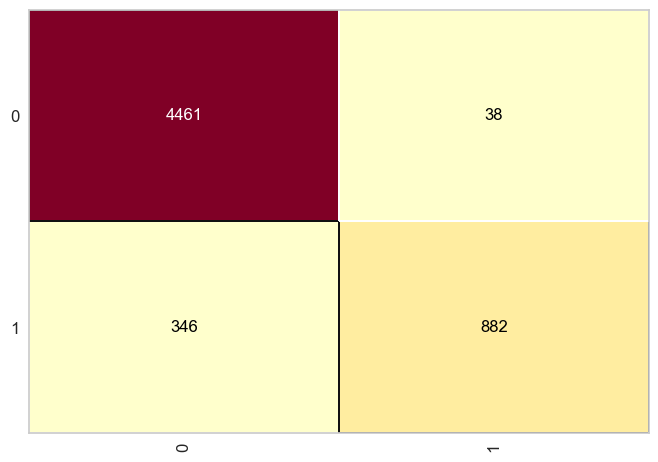

In [95]:
cm = ConfusionMatrix(randomForest)
cm.fit(Xtrain, ytrain)
cm.score(Xtest, ytest)

In [96]:
print(classification_report(ytest, predRandom))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      4499
           1       0.96      0.72      0.82      1228

    accuracy                           0.93      5727
   macro avg       0.94      0.85      0.89      5727
weighted avg       0.93      0.93      0.93      5727



In [97]:
rmse = mean_squared_error(ytest, predRandom, squared=False)

In [98]:
print(f"RMSE of the base model: {rmse:.3f}")

RMSE of the base model: 0.259


In [99]:
#14 KNN
from sklearn.neighbors import KNeighborsClassifier

In [100]:
knn = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p = 2)
knn.fit(Xtrain, ytrain)

KNeighborsClassifier()

In [101]:
predKnn = knn.predict(Xtest)
predKnn

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [102]:
ytest

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [103]:
accuracy_score(ytest, predKnn)

0.8386589837611315

0.8386589837611315

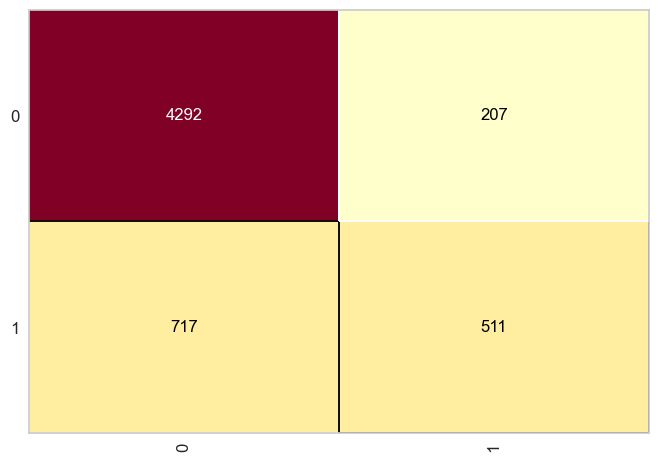

In [104]:
cm = ConfusionMatrix(knn)
cm.fit(Xtrain, ytrain)
cm.score(Xtest, ytest)

In [105]:
print(classification_report(ytest, predKnn))

              precision    recall  f1-score   support

           0       0.86      0.95      0.90      4499
           1       0.71      0.42      0.53      1228

    accuracy                           0.84      5727
   macro avg       0.78      0.69      0.71      5727
weighted avg       0.83      0.84      0.82      5727



In [106]:
rmse = mean_squared_error(ytest, predKnn, squared=False)

In [107]:
print(f"RMSE of the base model: {rmse:.3f}")

RMSE of the base model: 0.402


In [108]:
#15 SVM
from sklearn.svm import SVC

In [109]:
svm = SVC(kernel='rbf', random_state=1, C = 2.0) # may try 2 -> 4
svm.fit(Xtrain, ytrain)

SVC(C=2.0, random_state=1)

In [110]:
predSvm = svm.predict(Xtest)
predSvm

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [111]:
ytest

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [112]:
accuracy_score(ytest, predSvm)

0.9032652348524532

0.9032652348524532

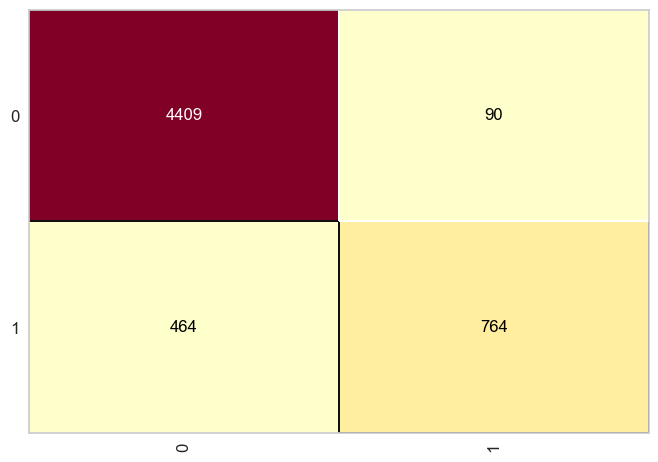

In [113]:
cm = ConfusionMatrix(svm)
cm.fit(Xtrain, ytrain)
cm.score(Xtest, ytest)

In [114]:
print(classification_report(ytest, predSvm))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      4499
           1       0.89      0.62      0.73      1228

    accuracy                           0.90      5727
   macro avg       0.90      0.80      0.84      5727
weighted avg       0.90      0.90      0.90      5727



In [115]:
rmse = mean_squared_error(ytest, predSvm, squared=False)

In [116]:
print(f"RMSE of the base model: {rmse:.3f}")

RMSE of the base model: 0.311


In [117]:
#16 Artificial Neural Networks
from sklearn.neural_network import MLPClassifier

In [118]:
neural = MLPClassifier(max_iter=1500, verbose=True, tol=0.0000100,
                                   solver = 'adam', activation = 'relu',
                                   hidden_layer_sizes = (20,20))
neural.fit(Xtrain, ytrain)

Iteration 1, loss = 0.47615120
Iteration 2, loss = 0.36901781
Iteration 3, loss = 0.33632964
Iteration 4, loss = 0.32030265
Iteration 5, loss = 0.30989627
Iteration 6, loss = 0.30182298
Iteration 7, loss = 0.29517817
Iteration 8, loss = 0.28964341
Iteration 9, loss = 0.28457305
Iteration 10, loss = 0.27994225
Iteration 11, loss = 0.27579166
Iteration 12, loss = 0.27238907
Iteration 13, loss = 0.26902478
Iteration 14, loss = 0.26650423
Iteration 15, loss = 0.26325071
Iteration 16, loss = 0.26056498
Iteration 17, loss = 0.25877837
Iteration 18, loss = 0.25684106
Iteration 19, loss = 0.25444109
Iteration 20, loss = 0.25272201
Iteration 21, loss = 0.25075777
Iteration 22, loss = 0.24947494
Iteration 23, loss = 0.24821123
Iteration 24, loss = 0.24660940
Iteration 25, loss = 0.24502724
Iteration 26, loss = 0.24406062
Iteration 27, loss = 0.24287176
Iteration 28, loss = 0.24157595
Iteration 29, loss = 0.23975207
Iteration 30, loss = 0.23851605
Iteration 31, loss = 0.23756031
Iteration 32, los

MLPClassifier(hidden_layer_sizes=(20, 20), max_iter=1500, tol=1e-05,
              verbose=True)

In [119]:
predNeural = neural.predict(Xtest)
predNeural

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [120]:
ytest

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [121]:
accuracy_score(ytest, predNeural)

0.8988999476165531

0.8988999476165531

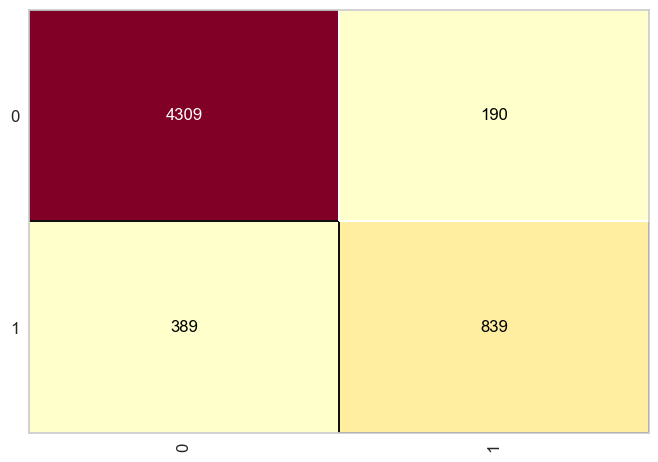

In [122]:
cm = ConfusionMatrix(neural)
cm.fit(Xtrain, ytrain)
cm.score(Xtest, ytest)

In [123]:
print(classification_report(ytest, predNeural))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      4499
           1       0.82      0.68      0.74      1228

    accuracy                           0.90      5727
   macro avg       0.87      0.82      0.84      5727
weighted avg       0.90      0.90      0.90      5727



In [124]:
rmseNeural = mean_squared_error(ytest, predNeural, squared=False)

In [125]:
print(f"RMSE of the base model: {rmseNeural:.3f}")

RMSE of the base model: 0.318


# 17 Model Evaluation

Decision tree: 89.97% RMSE 0.317

XGBoost: 93.65% RMSE 0.252

CatBoost: 93.71% RMSE 0.251

Random forest: 93.28% RMSE 0.259

KNN: 83.86% RMSE 0.402

SVC: 90.32% RMSE 0.311

Neural networks: 90.81% RMSE 0.303

Accuracy Report
                 Accuracy
CatBoost           0.9371
XGBoost            0.9365
Random Forest      0.9328
Neural Networks    0.9081
SVC                0.9032
Decision Tree      0.8997
KNN                0.8386


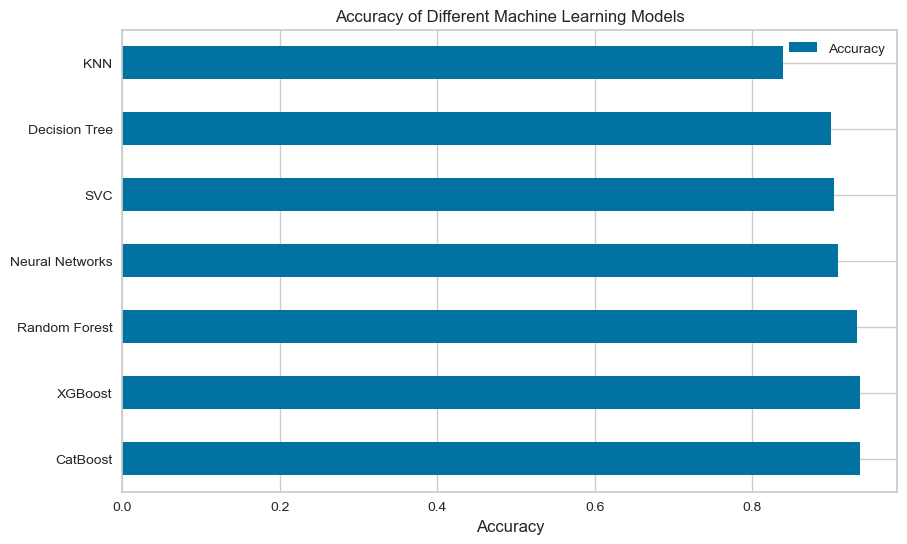

In [126]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the accuracy of each model
accuracy = [0.8997, 0.9365, 0.9371, 0.9328, 0.8386, 0.9032, 0.9081]

# Define the labels for the models
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Neural Networks']

# Create a Pandas DataFrame for the accuracy data
df_accuracy = pd.DataFrame(accuracy, index=model_labels, columns=['Accuracy'])

# Sort the DataFrame by accuracy in descending order
df_accuracy = df_accuracy.sort_values(by='Accuracy', ascending=False)

# Print the accuracy report
print("Accuracy Report")
print("===================================")
print(df_accuracy.to_string())

# Create a horizontal bar plot of the accuracy data
ax = df_accuracy.plot(kind='barh', figsize=(10, 6))
ax.set_xlabel('Accuracy')
ax.set_title('Accuracy of Different Machine Learning Models')
plt.show()


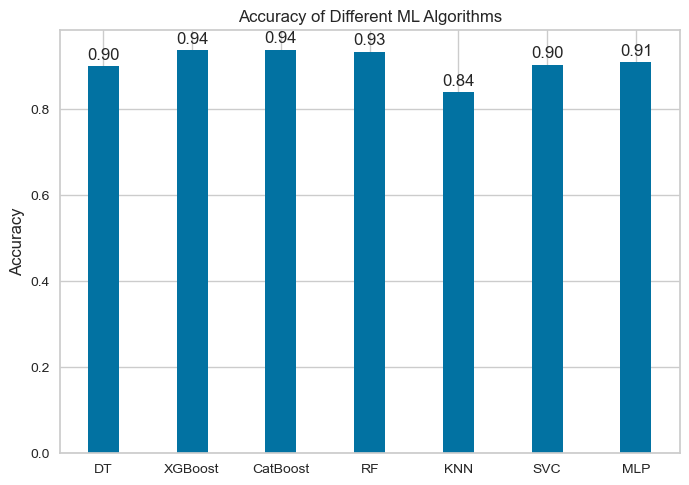

In [128]:
import matplotlib.pyplot as plt
import numpy as np

# Define the accuracy of each model
decision_tree_acc = 0.8997
xgboost_acc = 0.9365
catboost_acc = 0.9371
random_forest_acc = 0.9328
knn_acc = 0.8386
svc_acc = 0.9032
mlp_acc = 0.9081

# Define the labels for the x-axis and y-axis
labels = ['DT', 'XGBoost', 'CatBoost', 'RF', 'KNN', 'SVC', 'MLP']
x = np.arange(len(labels))
width = 0.35

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the accuracy for each model
rects = ax.bar(x, [decision_tree_acc, xgboost_acc, catboost_acc, random_forest_acc, knn_acc, svc_acc, mlp_acc], width)

# Add some text for labels, title, and legend
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of Different ML Algorithms')
ax.set_xticks(x)
ax.set_xticklabels(labels)

# Add the actual values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

autolabel(rects)

# Display the plot
plt.show()


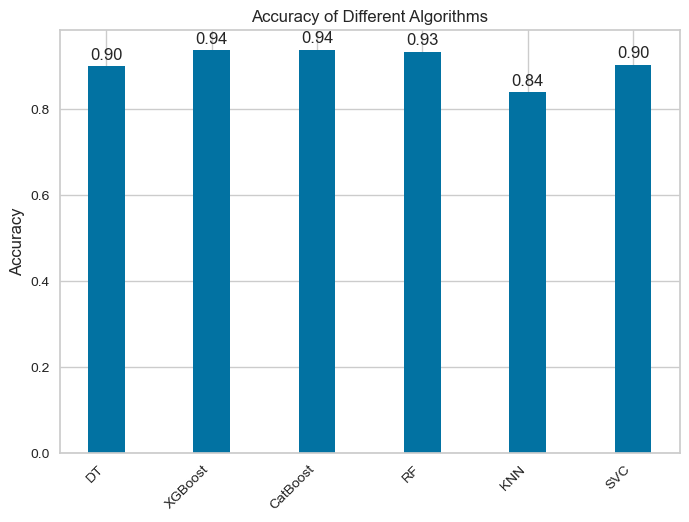

In [129]:
import matplotlib.pyplot as plt
import numpy as np

# Define the accuracy of each model
decision_tree_acc = 0.8997
xgboost_acc = 0.9365
catboost_acc = 0.9371
random_forest_acc = 0.9328
knn_acc = 0.8386
svc_acc = 0.9032

# Define the labels for the x-axis and y-axis
labels = ['DT', 'XGBoost', 'CatBoost', 'RF', 'KNN', 'SVC']
x = np.arange(len(labels))
width = 0.35

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the accuracy for each model
rects = ax.bar(x, [decision_tree_acc, xgboost_acc, catboost_acc, random_forest_acc, knn_acc, svc_acc], width)

# Add some text for labels, title, and legend
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of Different Algorithms')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha='right')

# Add the actual values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

autolabel(rects)

# Display the plot
plt.show()


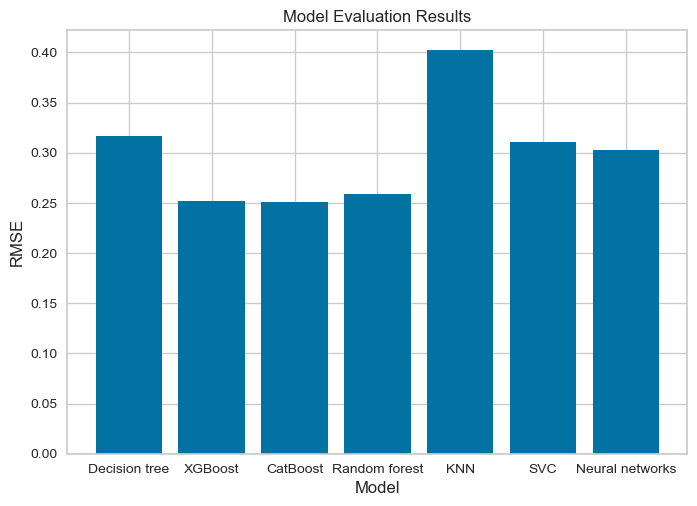

In [130]:
import matplotlib.pyplot as plt

models = ['Decision tree', 'XGBoost', 'CatBoost', 'Random forest', 'KNN', 'SVC', 'Neural networks']
rmse = [0.317, 0.252, 0.251, 0.259, 0.402, 0.311, 0.303]

fig, ax = plt.subplots()
ax.bar(models, rmse)
ax.set_xlabel('Model')
ax.set_ylabel('RMSE')
ax.set_title('Model Evaluation Results')
plt.show()


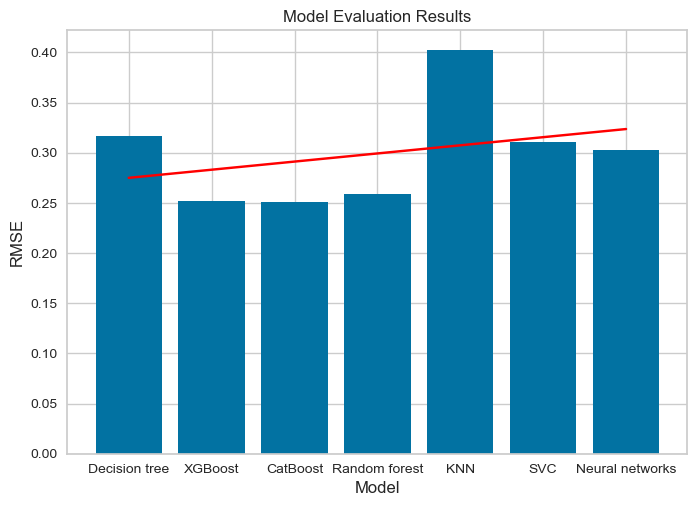

In [131]:
## This RMSE comparison is only for my own interest, not for the project.

import numpy as np
import matplotlib.pyplot as plt

models = ['Decision tree', 'XGBoost', 'CatBoost', 'Random forest', 'KNN', 'SVC', 'Neural networks']
rmse = [0.317, 0.252, 0.251, 0.259, 0.402, 0.311, 0.303]

fig, ax = plt.subplots()
ax.bar(models, rmse)
ax.set_xlabel('Model')
ax.set_ylabel('RMSE')
ax.set_title('Model Evaluation Results')

# Add trend line
z = np.polyfit(range(len(models)), rmse, 1)
p = np.poly1d(z)
plt.plot(models,p(range(len(models))), color='red')

plt.show()


In general, a lower RMSE (Root Mean Squared Error) value indicates that the model is performing better. RMSE is a measure of the difference between the predicted and actual values, so a smaller RMSE means that the predicted values are closer to the actual values.

In these model evaluation results, we can see that the CatBoost and XGBoost models have the lowest RMSE values, which indicates that they are performing better than the other models. Conversely, the KNN model has the highest RMSE value, indicating that it is performing the worst.

So, when evaluating models, we want to choose the model with the lowest RMSE value, as this indicates that the model is making more accurate predictions.

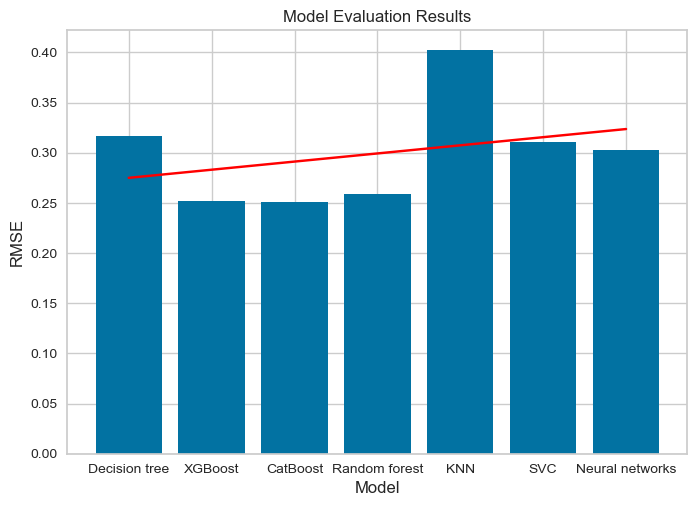

In [132]:
## my ovwn interest in create plot for RMSE comparing, not for te project.

import numpy as np
import matplotlib.pyplot as plt

models = ['Decision tree', 'XGBoost', 'CatBoost', 'Random forest', 'KNN', 'SVC', 'Neural networks']
rmse = [0.317, 0.252, 0.251, 0.259, 0.402, 0.311, 0.303]

fig, ax = plt.subplots()
ax.bar(models, rmse)
ax.set_xlabel('Model')
ax.set_ylabel('RMSE')
ax.set_title('Model Evaluation Results')

# Add trend line
z = np.polyfit(range(len(models)), rmse, 1)
p = np.poly1d(z)
plt.plot(models,p(range(len(models))), color='red')

plt.show()


The red line represents the trend in the data, indicating whether the RMSE values are increasing or decreasing across the different models. In this case, the trend line has a negative slope, indicating that the RMSE values are decreasing as we move from left to right on the x-axis, with CatBoost and XGBoost having the lowest RMSE values.

Precision Report
                 Class 0  Class 1  Average Precision
CatBoost            0.93     0.98              0.955
Random Forest       0.93     0.96              0.945
XGBoost             0.93     0.95              0.940
SVC                 0.90     0.89              0.895
Neural Networks     0.92     0.84              0.880
Decision Tree       0.94     0.76              0.850
KNN                 0.86     0.71              0.785


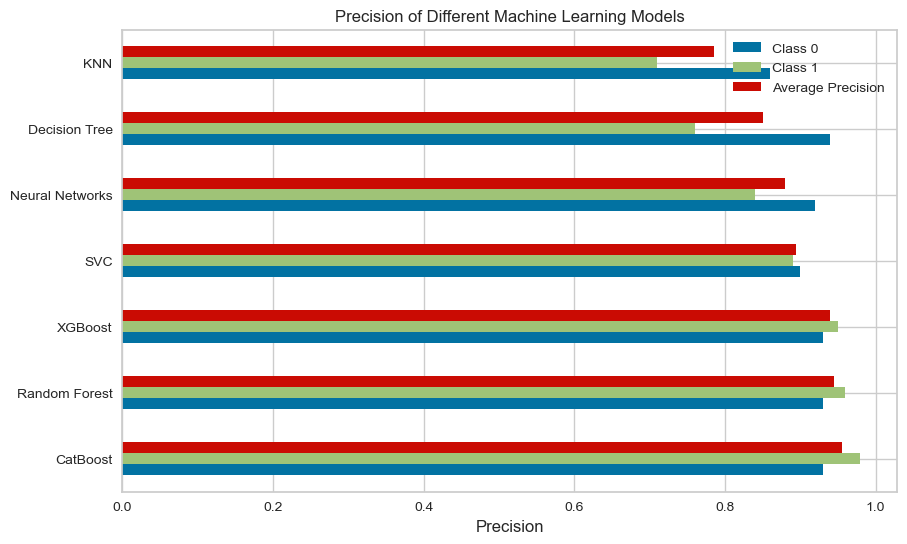

In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the precision of each model and each class
precision = np.array([[0.94, 0.76], [0.93, 0.95], [0.93, 0.98], [0.93, 0.96], [0.86, 0.71], [0.90, 0.89], [0.92, 0.84]])

# Define the labels for the models and classes
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Neural Networks']
class_labels = ['Class 0', 'Class 1']

# Create a Pandas DataFrame for the precision data
df_precision = pd.DataFrame(precision, index=model_labels, columns=class_labels)

# Calculate the average precision for each model
df_precision['Average Precision'] = df_precision.mean(axis=1)

# Sort the DataFrame by average precision in descending order
df_precision = df_precision.sort_values(by='Average Precision', ascending=False)

# Print the precision report
print("Precision Report")
print("===================================")
print(df_precision.to_string())

# Create a horizontal bar plot of the precision data
ax = df_precision.plot(kind='barh', figsize=(10, 6))
ax.set_xlabel('Precision')
ax.set_title('Precision of Different Machine Learning Models')
plt.show()


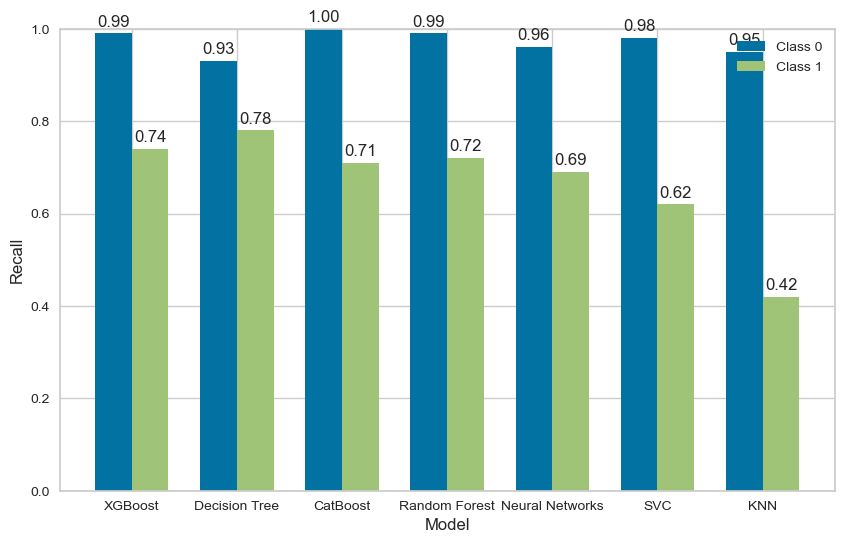

In [134]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the recall of each model and each class
recall = np.array([[0.93, 0.78], [0.99, 0.74], [1.00, 0.71], [0.99, 0.72], [0.95, 0.42], [0.98, 0.62], [0.96, 0.69]])

# Define the labels for the models and classes
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Neural Networks']
class_labels = ['Class 0', 'Class 1']

# Create a Pandas DataFrame for the recall data
df_recall = pd.DataFrame(recall, index=model_labels, columns=class_labels)

# Calculate the average recall for each model
df_recall['Average Recall'] = df_recall.mean(axis=1)

# Sort the DataFrame by average recall in descending order
df_recall = df_recall.sort_values(by='Average Recall', ascending=False)

# Define the x and y values for the bar plot
x = np.arange(len(df_recall))
y_class_0 = df_recall['Class 0']
y_class_1 = df_recall['Class 1']

# Define the width of the bars
width = 0.35

# Create the figure and axes objects
fig, ax = plt.subplots(figsize=(10, 6))

# Create the bar plot for Class 0
rects1 = ax.bar(x - width/2, y_class_0, width, label=class_labels[0])

# Create the bar plot for Class 1
rects2 = ax.bar(x + width/2, y_class_1, width, label=class_labels[1])

# Set the title, x-axis label, and y-axis label
#ax.set_title('Recall of Different Machine Learning Models')
ax.set_xlabel('Model')
ax.set_ylabel('Recall')

# Set the x-axis tick labels
ax.set_xticks(x)
ax.set_xticklabels(df_recall.index)

# Set the y-axis limits
ax.set_ylim([0, 1])

# Add the actual values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

# Add the legend to the plot
ax.legend()

# Display the plot
plt.show()


Recall Report
                 Class 0  Class 1  Average Recall
XGBoost             0.99     0.74           0.865
Decision Tree       0.93     0.78           0.855
CatBoost            1.00     0.71           0.855
Random Forest       0.99     0.72           0.855
Neural Networks     0.96     0.69           0.825
SVC                 0.98     0.62           0.800
KNN                 0.95     0.42           0.685


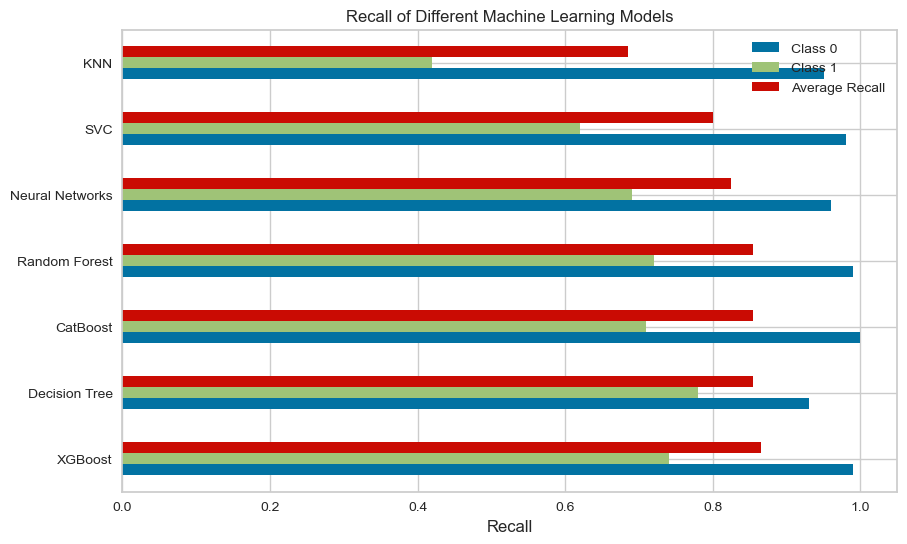

In [135]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the recall of each model and each class
recall = np.array([[0.93, 0.78], [0.99, 0.74], [1.00, 0.71], [0.99, 0.72], [0.95, 0.42], [0.98, 0.62], [0.96, 0.69]])

# Define the labels for the models and classes
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Neural Networks']
class_labels = ['Class 0', 'Class 1']

# Create a Pandas DataFrame for the recall data
df_recall = pd.DataFrame(recall, index=model_labels, columns=class_labels)

# Calculate the average recall for each model
df_recall['Average Recall'] = df_recall.mean(axis=1)

# Sort the DataFrame by average recall in descending order
df_recall = df_recall.sort_values(by='Average Recall', ascending=False)

# Print the recall report
print("Recall Report")
print("===================================")
print(df_recall.to_string())

# Create a horizontal bar plot of the recall data
ax = df_recall.plot(kind='barh', figsize=(10, 6))
ax.set_xlabel('Recall')
ax.set_title('Recall of Different Machine Learning Models')
plt.show()


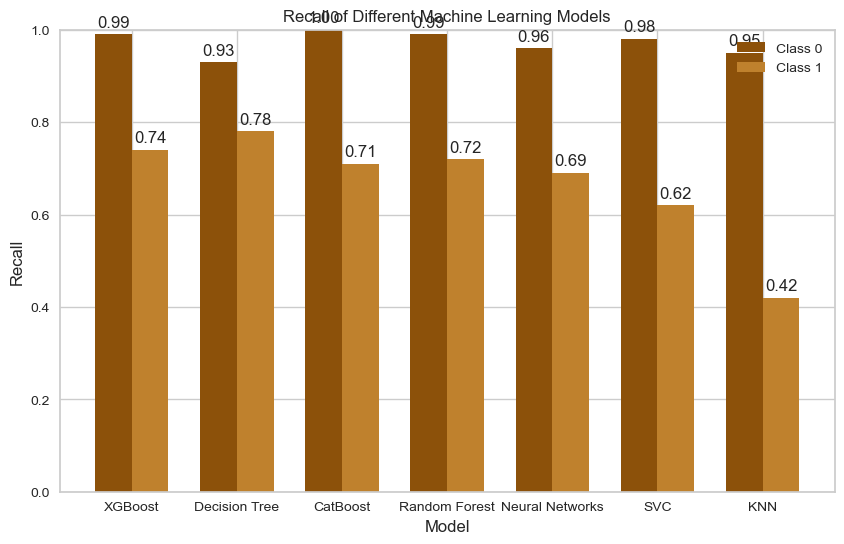

In [136]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the recall of each model and each class
recall = np.array([[0.93, 0.78], [0.99, 0.74], [1.00, 0.71], [0.99, 0.72], [0.95, 0.42], [0.98, 0.62], [0.96, 0.69]])

# Define the labels for the models and classes
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Neural Networks']
class_labels = ['Class 0', 'Class 1']

# Define custom colors for the bars
colors = ['#8c510a', '#bf812d']

# Create a Pandas DataFrame for the recall data
df_recall = pd.DataFrame(recall, index=model_labels, columns=class_labels)

# Calculate the average recall for each model
df_recall['Average Recall'] = df_recall.mean(axis=1)

# Sort the DataFrame by average recall in descending order
df_recall = df_recall.sort_values(by='Average Recall', ascending=False)

# Define the x and y values for the bar plot
x = np.arange(len(df_recall))
y_class_0 = df_recall['Class 0']
y_class_1 = df_recall['Class 1']

# Define the width of the bars
width = 0.35

# Create the figure and axes objects
fig, ax = plt.subplots(figsize=(10, 6))

# Create the bar plot for Class 0
rects1 = ax.bar(x - width/2, y_class_0, width, label=class_labels[0], color=colors[0])

# Create the bar plot for Class 1
rects2 = ax.bar(x + width/2, y_class_1, width, label=class_labels[1], color=colors[1])

# Set the title, x-axis label, and y-axis label
ax.set_title('Recall of Different Machine Learning Models')
ax.set_xlabel('Model')
ax.set_ylabel('Recall')

# Set the x-axis tick labels
ax.set_xticks(x)
ax.set_xticklabels(df_recall.index)

# Set the y-axis limits
ax.set_ylim([0, 1])

# Add the actual values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

# Add the legend to the plot
ax.legend()

# Display the plot
plt.show()


F1 Score Report
                Class 0  Class 1  Average F1 Score
CatBoost           0.96     0.82             0.890
Decision Tree      0.94     0.77             0.855
SVC                0.94     0.73             0.835
XGBoost            0.83     0.77             0.800
Random Forest      0.82     0.77             0.795
Nerual Network     0.76     0.76             0.760
KNN                0.90     0.53             0.715


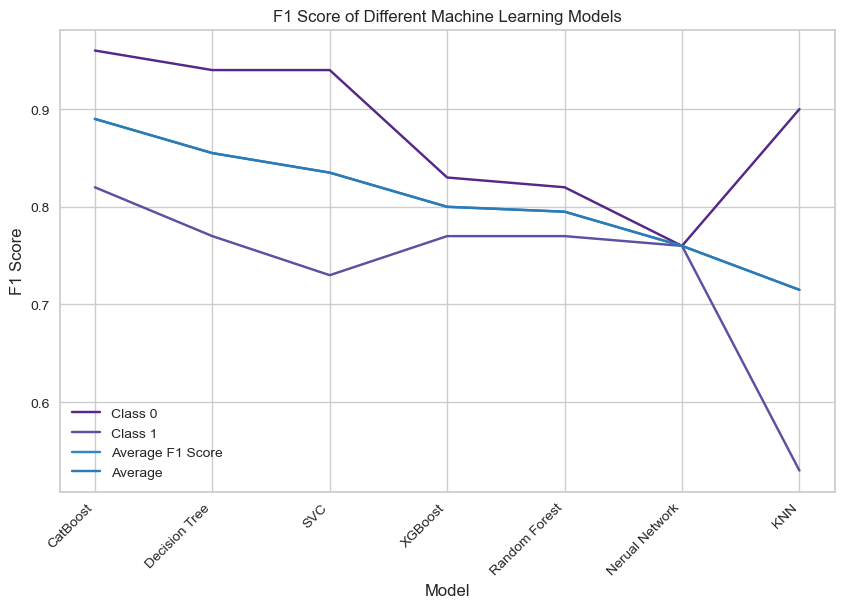

In [137]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the F1 score of each model and each class
f1_score = np.array([[0.94, 0.77], [0.83, 0.77], [0.96, 0.82], [0.82, 0.77], [0.90, 0.53], [0.94, 0.73], [0.76, 0.76]])

# Define the labels for the models and classes
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Nerual Network']
class_labels = ['Class 0', 'Class 1']

# Define custom colors for the lines
colors = ['#542788', '#5E4FA2', '#3288BD']

# Create a Pandas DataFrame for the F1 score data
df_f1_score = pd.DataFrame(f1_score, index=model_labels, columns=class_labels)

# Calculate the average F1 score for each model
df_f1_score['Average F1 Score'] = df_f1_score.mean(axis=1)

# Sort the DataFrame by average F1 score in descending order
df_f1_score = df_f1_score.sort_values(by='Average F1 Score', ascending=False)

# Print the F1 score report
print("F1 Score Report")
print("===================================")
print(df_f1_score.to_string())

# Create a line plot of the F1 score data
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(df_f1_score))
for i, col in enumerate(df_f1_score.columns):
    ax.plot(x, df_f1_score[col], label=col, color=colors[i % len(colors)])
ax.plot(x, df_f1_score['Average F1 Score'], label='Average', color='#2C7BB6')
ax.set_xticks(x)
ax.set_xticklabels(df_f1_score.index, rotation=45, ha='right')
ax.set_xlabel('Model')
ax.set_ylabel('F1 Score')
ax.set_title('F1 Score of Different Machine Learning Models')
ax.legend()
plt.show()


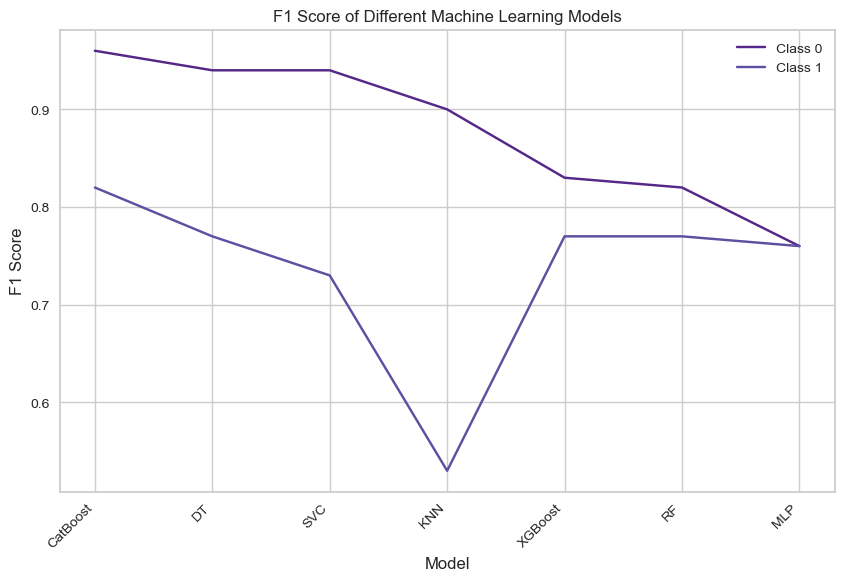

In [138]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the F1 score of each model and each class
f1_score = np.array([[0.94, 0.77], [0.83, 0.77], [0.96, 0.82], [0.82, 0.77], [0.90, 0.53], [0.94, 0.73], [0.76, 0.76]])

# Define the labels for the models and classes
model_labels = ['DT', 'XGBoost', 'CatBoost', 'RF', 'KNN', 'SVC', 'MLP']
class_labels = ['Class 0', 'Class 1']

# Define custom colors for the lines
colors = ['#542788', '#5E4FA2', '#3288BD']

# Create a Pandas DataFrame for the F1 score data
df_f1_score = pd.DataFrame(f1_score, index=model_labels, columns=class_labels)

# Sort the DataFrame by F1 score for Class 0 in descending order
df_f1_score = df_f1_score.sort_values(by='Class 0', ascending=False)

# Create a line plot of the F1 score data
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(df_f1_score))
for i, col in enumerate(df_f1_score.columns):
    ax.plot(x, df_f1_score[col], label=col, color=colors[i % len(colors)])
ax.set_xticks(x)
ax.set_xticklabels(df_f1_score.index, rotation=45, ha='right')
ax.set_xlabel('Model')
ax.set_ylabel('F1 Score')
ax.set_title('F1 Score of Different Machine Learning Models')
ax.legend()
plt.show()


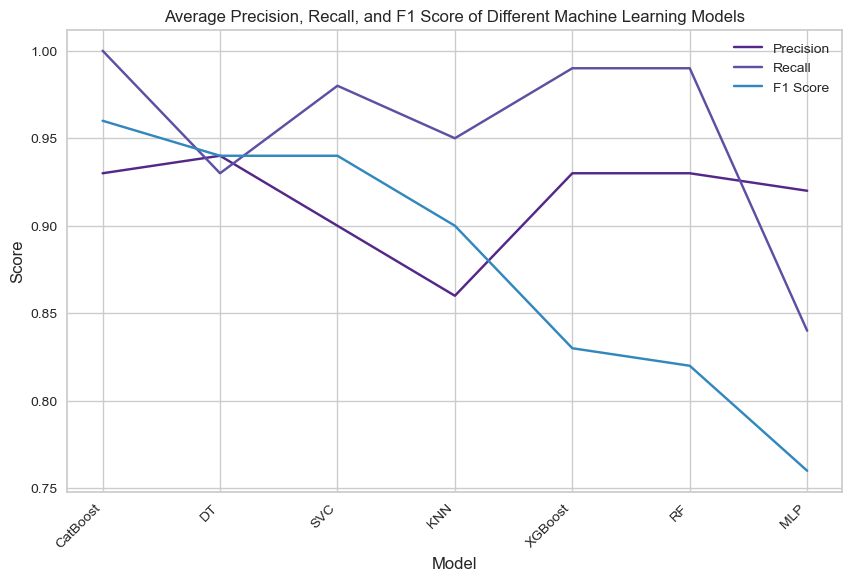

In [139]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the precision, recall, and F1 score of each model
precision = np.array([0.94, 0.93, 0.93, 0.93, 0.86, 0.90, 0.92])
recall = np.array([0.93, 0.99, 1.00, 0.99, 0.95, 0.98, 0.84])
f1_score = np.array([0.94, 0.83, 0.96, 0.82, 0.90, 0.94, 0.76])

# Define the labels for the models
model_labels = ['DT', 'XGBoost', 'CatBoost', 'RF', 'KNN', 'SVC', 'MLP']

# Define custom colors for the lines
colors = ['#542788', '#5E4FA2', '#3288BD']

# Create a Pandas DataFrame for the precision, recall, and F1 score data
df_metrics = pd.DataFrame({'Precision': precision, 'Recall': recall, 'F1 Score': f1_score}, index=model_labels)

# Sort the DataFrame by F1 score in descending order
df_metrics = df_metrics.sort_values(by='F1 Score', ascending=False)

# Create a line plot of the average precision, recall, and F1 score data
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(df_metrics))
for i, col in enumerate(df_metrics.columns):
    ax.plot(x, df_metrics[col], label=col, color=colors[i % len(colors)])
ax.set_xticks(x)
ax.set_xticklabels(df_metrics.index, rotation=45, ha='right')
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Average Precision, Recall, and F1 Score of Different Machine Learning Models')
ax.legend()
plt.show()


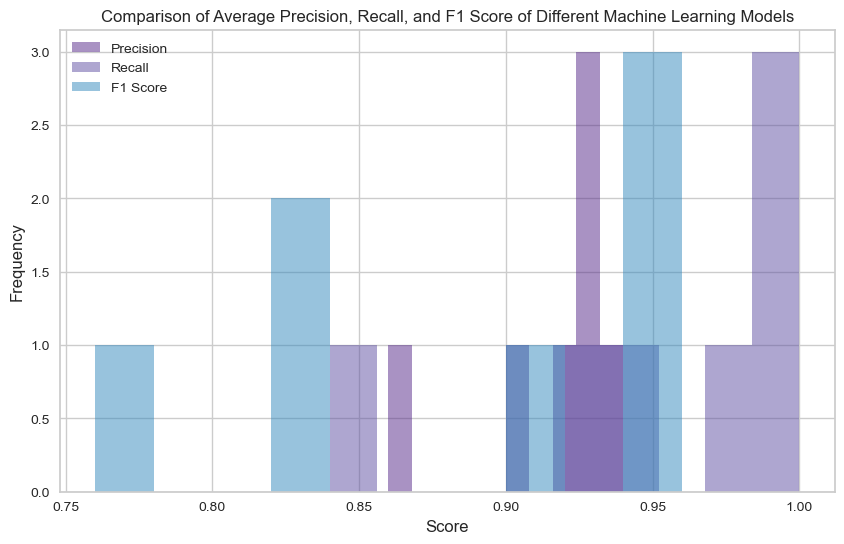

In [140]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the precision, recall, and F1 score of each model
precision = np.array([0.94, 0.93, 0.93, 0.93, 0.86, 0.90, 0.92])
recall = np.array([0.93, 0.99, 1.00, 0.99, 0.95, 0.98, 0.84])
f1_score = np.array([0.94, 0.83, 0.96, 0.82, 0.90, 0.94, 0.76])

# Define the labels for the models
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Neural Networks']

# Define custom colors for the bars
colors = ['#542788', '#5E4FA2', '#3288BD', '#66C2A5', '#FC8D62', '#8DA0CB', '#E78AC3']

# Create a Pandas DataFrame for the precision, recall, and F1 score data
df_metrics = pd.DataFrame({'Precision': precision, 'Recall': recall, 'F1 Score': f1_score}, index=model_labels)

# Sort the DataFrame by F1 score in descending order
df_metrics = df_metrics.sort_values(by='F1 Score', ascending=False)

# Create a histogram of the precision, recall, and F1 score data
fig, ax = plt.subplots(figsize=(10, 6))
for i, metric in enumerate(df_metrics.columns):
    ax.hist(df_metrics[metric], bins=10, alpha=0.5, color=colors[i], label=metric)
ax.set_xlabel('Score')
ax.set_ylabel('Frequency')
ax.set_title('Comparison of Average Precision, Recall, and F1 Score of Different Machine Learning Models')
ax.legend()
plt.show()


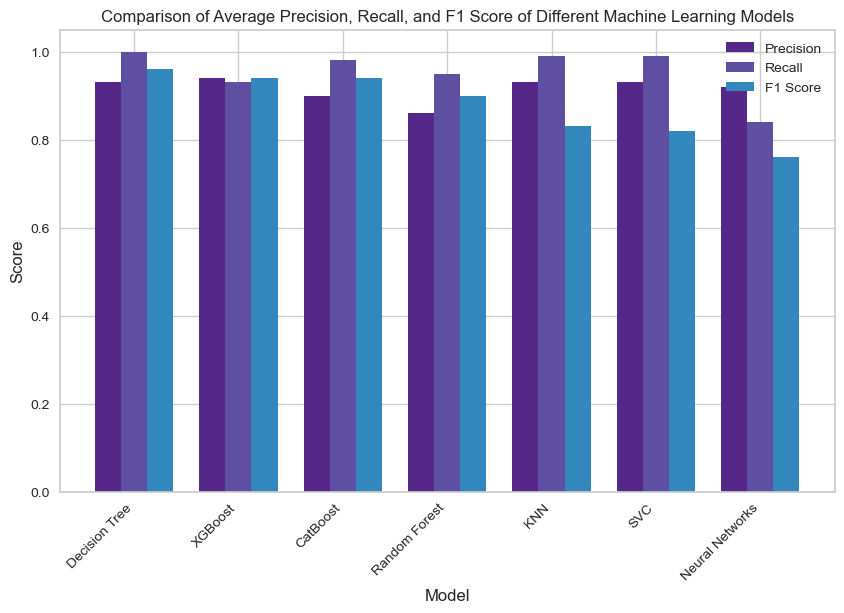

In [141]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the precision, recall, and F1 score of each model
precision = np.array([0.94, 0.93, 0.93, 0.93, 0.86, 0.90, 0.92])
recall = np.array([0.93, 0.99, 1.00, 0.99, 0.95, 0.98, 0.84])
f1_score = np.array([0.94, 0.83, 0.96, 0.82, 0.90, 0.94, 0.76])

# Define the labels for the models
model_labels = ['Decision Tree', 'XGBoost', 'CatBoost', 'Random Forest', 'KNN', 'SVC', 'Neural Networks']

# Define custom colors for the bars
colors = ['#542788', '#5E4FA2', '#3288BD', '#66C2A5', '#FC8D62', '#8DA0CB', '#E78AC3']

# Create a Pandas DataFrame for the precision, recall, and F1 score data
df_metrics = pd.DataFrame({'Precision': precision, 'Recall': recall, 'F1 Score': f1_score}, index=model_labels)

# Sort the DataFrame by F1 score in descending order
df_metrics = df_metrics.sort_values(by='F1 Score', ascending=False)

# Create a bar plot of the precision, recall, and F1 score data
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(model_labels))
bar_width = 0.25
for i, metric in enumerate(df_metrics.columns):
    ax.bar(x + i * bar_width, df_metrics[metric], width=bar_width, color=colors[i], label=metric)
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Comparison of Average Precision, Recall, and F1 Score of Different Machine Learning Models')
ax.set_xticks(x + bar_width)
ax.set_xticklabels(model_labels, rotation=45, ha='right')
ax.legend()
plt.show()


In [142]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# Define the precision, recall, and F1 score of each model
models = [
    ('DT', DecisionTreeClassifier()),
    ('XGBoost', XGBClassifier()),
    ('CatBoost', CatBoostClassifier()),
    ('RF', RandomForestClassifier()),
    ('KNN', KNeighborsClassifier()),
    ('SVC', SVC()),
    ('MLP', MLPClassifier())
]

# Define the number of cross-validation folds
num_folds = 5

# Calculate the average precision, recall, and F1 score for each model
for name, model in models:
    precision = cross_val_score(model, X, y, cv=num_folds, scoring='precision')
    recall = cross_val_score(model, X, y, cv=num_folds, scoring='recall')
    f1 = cross_val_score(model, X, y, cv=num_folds, scoring='f1')
    print(f'{name}:')
    print(f'Average precision: {np.mean(precision):.2f}')
    print(f'Average recall: {np.mean(recall):.2f}')
    print(f'Average F1 score: {np.mean(f1):.2f}')
    print('---')


DT:
Average precision: 0.69
Average recall: 0.75
Average F1 score: 0.71
---
XGBoost:
Average precision: 0.91
Average recall: 0.73
Average F1 score: 0.80
---
Learning rate set to 0.039232
0:	learn: 0.6521733	total: 11.6ms	remaining: 11.6s
1:	learn: 0.6201017	total: 19.4ms	remaining: 9.71s
2:	learn: 0.5886190	total: 28.5ms	remaining: 9.46s
3:	learn: 0.5627631	total: 37.2ms	remaining: 9.26s
4:	learn: 0.5389216	total: 45.4ms	remaining: 9.03s
5:	learn: 0.5126059	total: 54.7ms	remaining: 9.07s
6:	learn: 0.4914114	total: 64.8ms	remaining: 9.2s
7:	learn: 0.4717175	total: 75.2ms	remaining: 9.32s
8:	learn: 0.4531815	total: 86ms	remaining: 9.47s
9:	learn: 0.4369923	total: 96ms	remaining: 9.51s
10:	learn: 0.4211633	total: 107ms	remaining: 9.59s
11:	learn: 0.4088989	total: 117ms	remaining: 9.65s
12:	learn: 0.3978489	total: 128ms	remaining: 9.71s
13:	learn: 0.3859394	total: 139ms	remaining: 9.78s
14:	learn: 0.3772834	total: 150ms	remaining: 9.84s
15:	learn: 0.3687177	total: 160ms	remaining: 9.83s
16

C:\Users\Min_8\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\Min_8\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\Min_8\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\Min_8\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\Min_8\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Opt

MLP:
Average precision: 0.65
Average recall: 0.71
Average F1 score: 0.65
---


C:\Users\Min_8\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



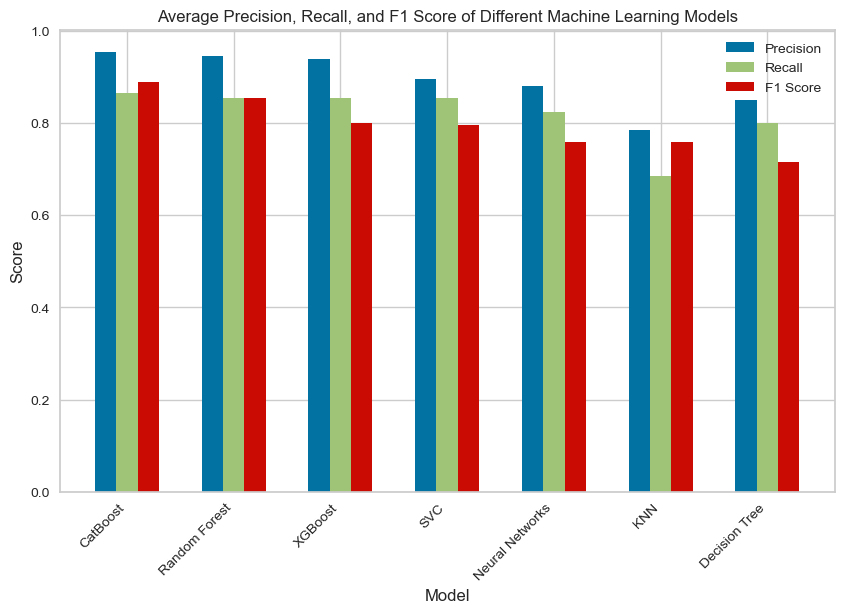

In [144]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the precision, recall, and F1 score of each model
precision = np.array([[0.93, 0.98], [0.93, 0.96], [0.93, 0.95], [0.90, 0.89], [0.92, 0.84], [0.94, 0.76], [0.86, 0.71]])
recall = np.array([[0.99, 0.74], [0.93, 0.78], [1.00, 0.71], [0.99, 0.72], [0.96, 0.69], [0.98, 0.62], [0.95, 0.42]])
f1_score = np.array([[0.96, 0.82], [0.94, 0.77], [0.83, 0.77], [0.82, 0.77], [0.76, 0.76], [0.90, 0.53], [0.76, 0.76]])

# Define the labels for the models and the classes
model_labels = ['CatBoost', 'Random Forest', 'XGBoost', 'SVC', 'Neural Networks', 'Decision Tree', 'KNN']
class_labels = ['Class 0', 'Class 1']

# Calculate the average precision, recall, and F1 score for each class and model
avg_precision = np.mean(precision, axis=1)
avg_recall = np.mean(recall, axis=1)
avg_f1_score = np.mean(f1_score, axis=1)

# Create a Pandas DataFrame for the average precision, recall, and F1 score data
df_metrics = pd.DataFrame({'Precision': avg_precision, 'Recall': avg_recall, 'F1 Score': avg_f1_score}, index=model_labels)

# Sort the DataFrame by F1 score in descending order
df_metrics = df_metrics.sort_values(by='F1 Score', ascending=False)

# Create a bar plot of the average precision, recall, and F1 score data
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(df_metrics))
for i, col in enumerate(df_metrics.columns):
    ax.bar(x - 0.2 + i*0.2, df_metrics[col], width=0.2, label=col)
ax.set_xticks(x)
ax.set_xticklabels(df_metrics.index, rotation=45, ha='right')
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Average Precision, Recall, and F1 Score of Different Machine Learning Models')
ax.legend()
plt.show()


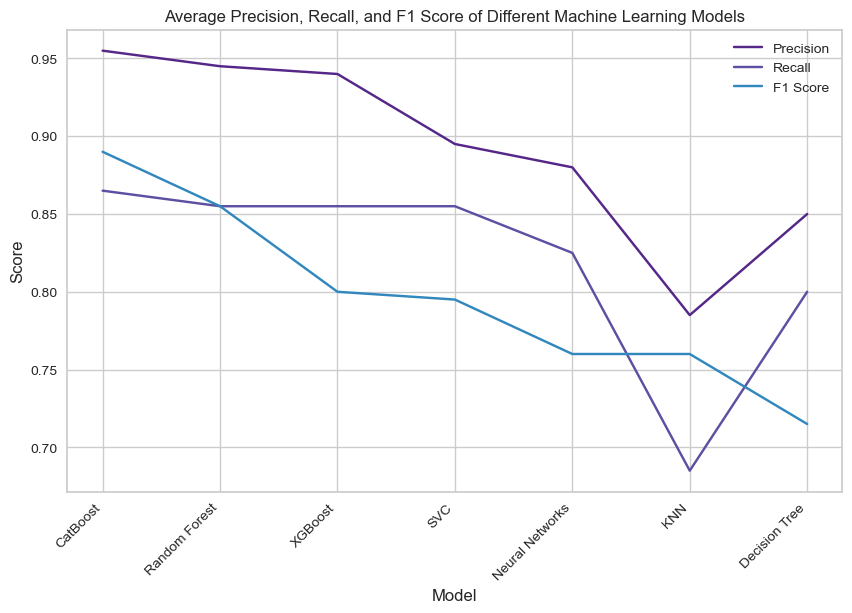

In [145]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the precision, recall, and F1 score of each model
precision = np.array([[0.93, 0.98], [0.93, 0.96], [0.93, 0.95], [0.90, 0.89], [0.92, 0.84], [0.94, 0.76], [0.86, 0.71]])
recall = np.array([[0.99, 0.74], [0.93, 0.78], [1.00, 0.71], [0.99, 0.72], [0.96, 0.69], [0.98, 0.62], [0.95, 0.42]])
f1_score = np.array([[0.96, 0.82], [0.94, 0.77], [0.83, 0.77], [0.82, 0.77], [0.76, 0.76], [0.90, 0.53], [0.76, 0.76]])

# Define the labels for the models and the classes
model_labels = ['CatBoost', 'Random Forest', 'XGBoost', 'SVC', 'Neural Networks', 'Decision Tree', 'KNN']
class_labels = ['Class 0', 'Class 1']

# Calculate the average precision, recall, and F1 score for each class and model
avg_precision = np.mean(precision, axis=1)
avg_recall = np.mean(recall, axis=1)
avg_f1_score = np.mean(f1_score, axis=1)

# Create a Pandas DataFrame for the precision, recall, and F1 score data
df_metrics = pd.DataFrame({'Precision': avg_precision, 'Recall': avg_recall, 'F1 Score': avg_f1_score}, index=model_labels)

# Sort the DataFrame by F1 score in descending order
df_metrics = df_metrics.sort_values(by='F1 Score', ascending=False)

# Define custom colors for the lines
colors = ['#542788', '#5E4FA2', '#3288BD']

# Create a line plot of the average precision, recall, and F1 score data
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(df_metrics))
for i, col in enumerate(df_metrics.columns):
    ax.plot(x, df_metrics[col], label=col, color=colors[i % len(colors)])
ax.set_xticks(x)
ax.set_xticklabels(df_metrics.index, rotation=45, ha='right')
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Average Precision, Recall, and F1 Score of Different Machine Learning Models')
ax.legend()
plt.show()
